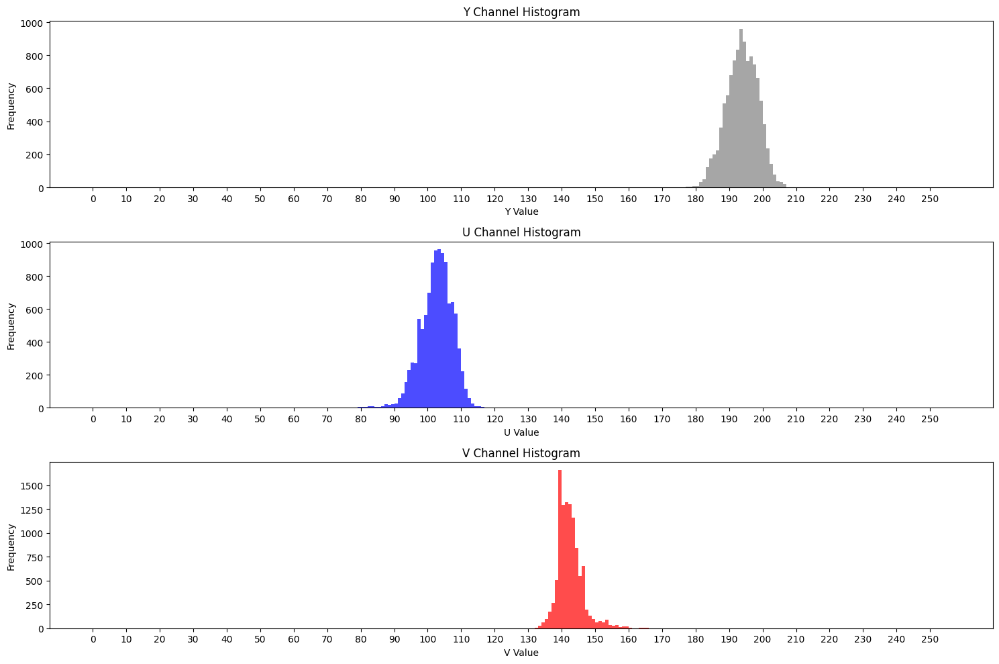

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_yuv_histogram(frame):
    # Convert frame to YUV color space
    yuv_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2YUV)

    # Split channels
    y, u, v = cv2.split(yuv_frame)

    # Flatten the channels to 1D arrays
    y_flat = y.flatten()
    u_flat = u.flatten()
    v_flat = v.flatten()

    # Plot histograms
    plt.figure(figsize=(15, 10))

    # Y channel histogram
    plt.subplot(3, 1, 1)
    plt.hist(y_flat, bins=256, range=(0, 256), color='gray', alpha=0.7)
    plt.title('Y Channel Histogram')
    plt.xlabel('Y Value')
    plt.ylabel('Frequency')
    plt.xticks(np.arange(0, 256, step=10))  # Adjust tick marks for better readability

    # U channel histogram
    plt.subplot(3, 1, 2)
    plt.hist(u_flat, bins=256, range=(0, 256), color='blue', alpha=0.7)
    plt.title('U Channel Histogram')
    plt.xlabel('U Value')
    plt.ylabel('Frequency')
    plt.xticks(np.arange(0, 256, step=10))  # Adjust tick marks for better readability

    # V channel histogram
    plt.subplot(3, 1, 3)
    plt.hist(v_flat, bins=256, range=(0, 256), color='red', alpha=0.7)
    plt.title('V Channel Histogram')
    plt.xlabel('V Value')
    plt.ylabel('Frequency')
    plt.xticks(np.arange(0, 256, step=10))  # Adjust tick marks for better readability

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    # Load an image frame
    image_path = ''
    frame = cv2.imread(image_path)

    # Check if the image is loaded successfully
    if frame is not None:
        plot_yuv_histogram(frame)
    else:
        print("Error: Image not loaded.")


Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/174284780.jpg: 91
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/138618409.jpg: 874
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/136351752.jpg: 1324
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/114718609.jpg: 0
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/194684618.jpg: 0
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/108985303.jpg: 0
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/95152135.jpg: 6345
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/da

/var/folders/w2/5tlr83vj1zv65xj2x2_lv1700000gn/T/ipykernel_3026/602213108.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/120118579.jpg: 0
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/154718271.jpg: 0
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/202684559.jpg: 0
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/170651509.jpg: 1357
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/251284172.jpg: 10836
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/115118587.jpg: 0
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/data_aug_notebooks/Filter_9000/last_prac_run_raw/113018609.jpg: 0
Total count for /Users/exievexie/Desktop/AE4317/Machine_Vision_OD/dat

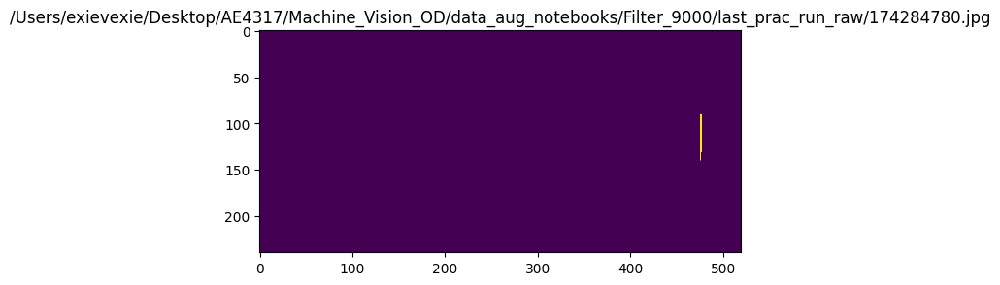

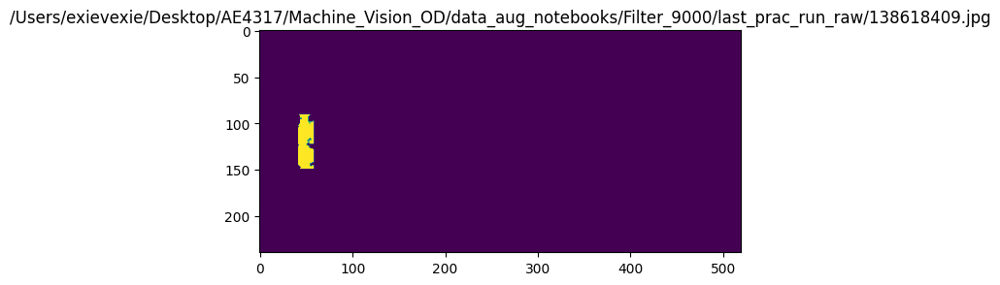

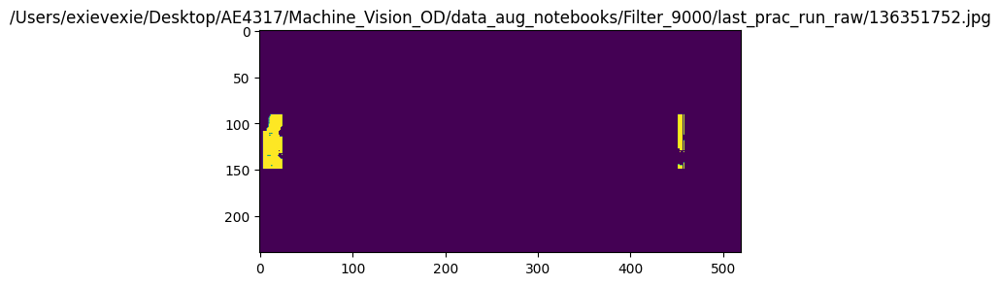

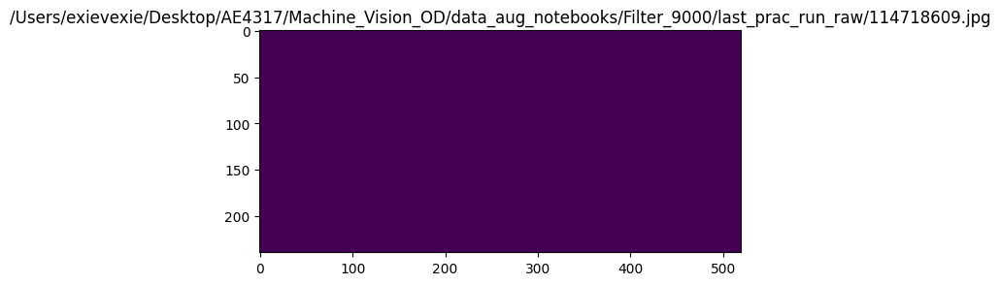

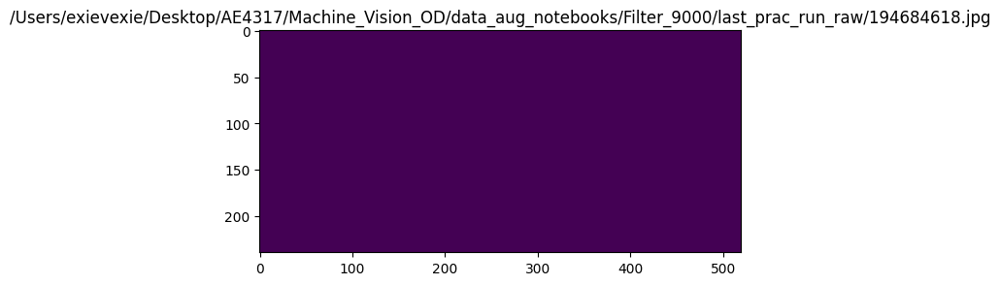

...

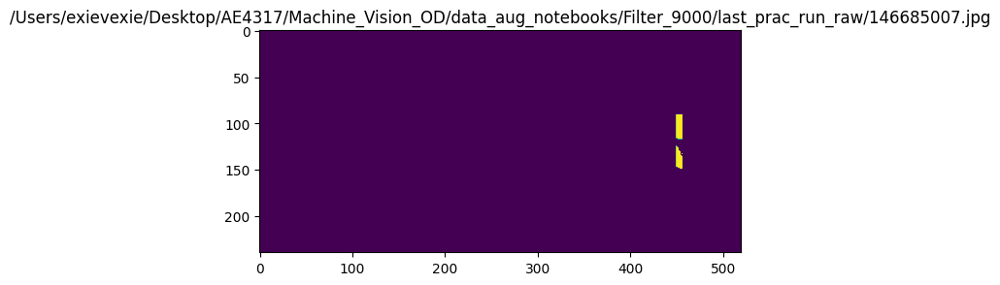

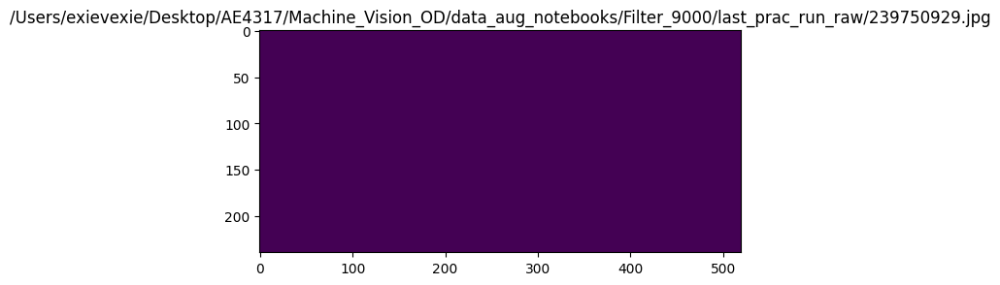

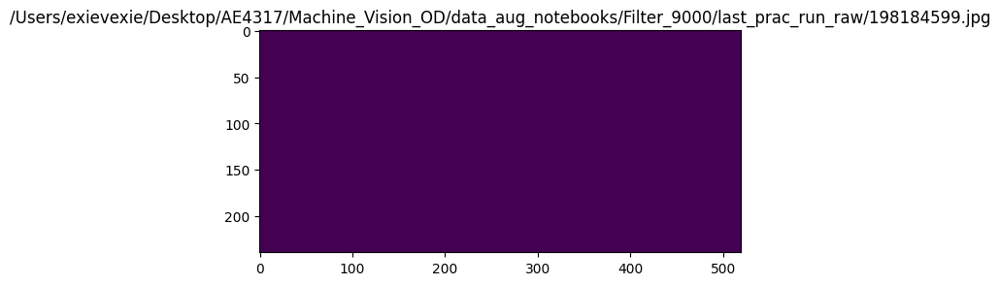

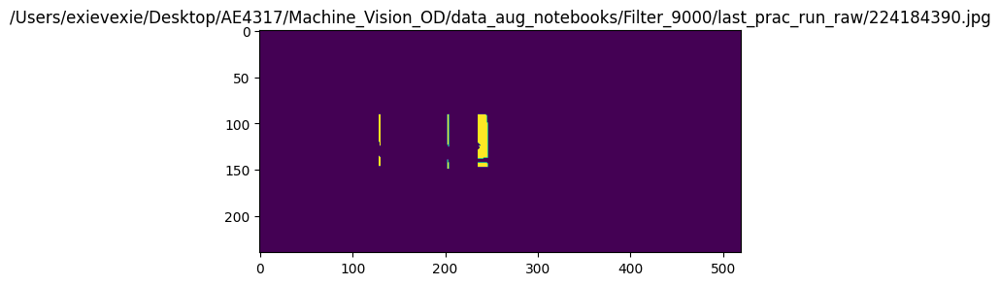

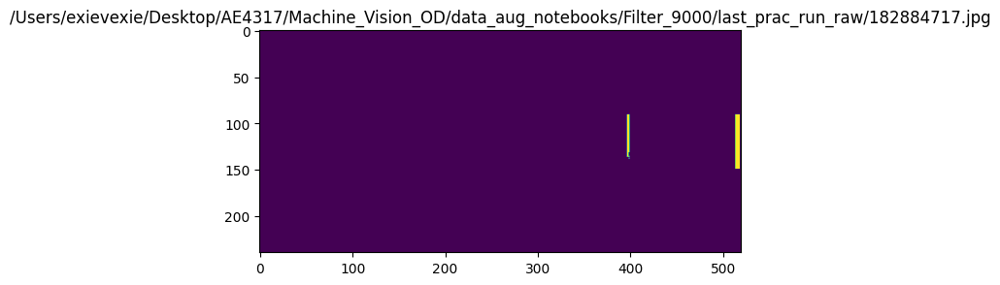

In [4]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Define the function to convert YUV to RGB
def YUV_to_RGB(im):
    """ Convert YUV to RGB """
    if np.max(im[:]) <= 1.0:
        im *= 255
        
    Y = im[:,:,0]
    U = im[:,:,1]
    V = im[:,:,2]
    
    R  = Y + 1.402   * ( V - 128 )
    G  = Y - 0.34414 * ( U - 128 ) - 0.71414 * ( V - 128 )
    B  = Y + 1.772   * ( U - 128 )

    rgb = im
    rgb[:,:,0] = R / 255.0
    rgb[:,:,1] = G / 255.0
    rgb[:,:,2] = B / 255.0

    inds1 = np.where(rgb < 0.0)
    for i in range(len(inds1[0])):
        rgb[inds1[0][i], inds1[1][i], inds1[2][i]] = 0.0
        
    inds2 = np.where(rgb > 1.0)
    for i in range(len(inds2[0])):
        rgb[inds2[0][i], inds2[1][i], inds2[2][i]] = 1.0
    return rgb

# Define the function to filter colors
def filter_color(image_name, output_folder, y_low=0, y_high=24, u_low=0, u_high=255, v_low=0, v_high=255, resize_factor=1, showpicbefore=0):
    count_ones = 0
    im = cv2.imread(image_name)
    im = cv2.resize(im, (int(im.shape[1]/resize_factor), int(im.shape[0]/resize_factor)))
    im = cv2.rotate(im, cv2.ROTATE_90_COUNTERCLOCKWISE)
    YUV = cv2.cvtColor(im, cv2.COLOR_BGR2YUV)
    Filtered = np.zeros([YUV.shape[0], YUV.shape[1]])
    protected = {}
    for i in getAllRanges():
        for x in range(YUV.shape[1]):
            count_x = 0
            density_high_lum_x = 0
            density_black_x = 0
            good_y_high_lum = []
            good_y_black = []
            density_orange_x = 0
            good_y_orange = []
            for y in range(YUV.shape[0]):
                if (90 < y < 150):
                    if (YUV[y,x,0] >= i[0] and YUV[y,x,0] <= i[1] and \
                        YUV[y,x,1] >= i[2] and YUV[y,x,1] <= i[3] and \
                        YUV[y,x,2] >= i[4] and YUV[y,x,2] <= i[5]):
                        if i[6] == "orange":
                            density_orange_x += 1
                            good_y_orange.append(y)
                        if i[6] == "green":
                            count_x += 2
                        if i[6] == "High Lum":
                            density_high_lum_x +=1
                            good_y_high_lum.append(y)
                        elif i[6] == "black":
                            if x not in protected:
                                YUV[y,x,0] = 255
                                count_x += 1
                                Filtered[y,x] = 1
                            else:
                                density_black_x +=1
                                good_y_black.append(y)
                        else:
                            YUV[y,x,0] = 255
                            Filtered[y,x] = 1
                            count_x += 1
            if (density_orange_x > 25):
                count_x += density_orange_x
                for good_y in good_y_orange:
                    YUV[good_y,x,0] = 255
                    Filtered[good_y,x] = 1
            if (density_high_lum_x > 40):
                count_x += density_high_lum_x
                for good_y in good_y_high_lum:
                    YUV[good_y,x,0] = 255
                    Filtered[good_y,x] = 1
            if (density_black_x > 20):
                count_x += density_black_x
                for good_y in good_y_black:
                    YUV[good_y,x,0] = 255
                    Filtered[good_y,x] = 1
            if (x < 70 or x > 450):
                count_ones += count_x
            elif (x < 140 or x > 380):
                count_ones += count_x * 2
            elif (x < 210 or x > 310):
                count_ones += count_x * 3
            else:
                count_ones += count_x * 4
                
    if (showpicbefore == 1):
        plt.figure()
        RGB = cv2.cvtColor(YUV, cv2.COLOR_YUV2RGB)
        plt.imshow(RGB)
        plt.title(image_name)
        plt.savefig(os.path.join(output_folder, os.path.basename(image_name) + "_YUV_RGB.png"))
        
        plt.figure()
        RGB = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        plt.imshow(RGB)
        plt.title(image_name)
        plt.savefig(os.path.join(output_folder, os.path.basename(image_name) + "_original.png"))

    plt.figure()
    plt.imshow(Filtered)
    plt.title(image_name)
    plt.savefig(os.path.join(output_folder, os.path.basename(image_name) + "_filtered.png"))

    print(f"Total count for {image_name}: {count_ones}")

# Define functions to get color ranges
def getOrangeRange(y_low=30, y_high=190, u_low=70, u_high=130, v_low=150, v_high=190):
    return [y_low, y_high, u_low, u_high, v_low, v_high, "orange"]

def getGreenRange(y_low=75, y_high=160, u_low=67, u_high=120, v_low=110, v_high=150):
    return [y_low, y_high, u_low, u_high, v_low, v_high, "green"]

def getDarkBlackRange(y_low=0, y_high=24, u_low=0, u_high=255, v_low=0, v_high=255):
    return [y_low, y_high, u_low, u_high, v_low, v_high, "dark black"]

def getHighLumRange(y_low=220, y_high=255, u_low=0, u_high=255, v_low=0, v_high=255):
    return [y_low, y_high, u_low, u_high, v_low, v_high, "High Lum"]

def getBlackRange(y_low=80, y_high=110, u_low=120, u_high=130, v_low=130, v_high=145):
    return [y_low, y_high, u_low, u_high, v_low, v_high, "black"]     

# Define a function to get all color ranges
def getAllRanges():
    return [
            #getOrangeRange(), 
            #getGreenRange(), 
            #getDarkBlackRange(), 
            getHighLumRange(), 
            #getBlackRange()
            ]

if __name__ == '__main__':
    # Define input and output folders
    input_folder = ""
    output_folder = ""
    
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Iterate through the files in the input folder
    for file_name in os.listdir(input_folder):
        if file_name.endswith(('.jpg', '.jpeg', '.png', '.bmp')):
            # Construct the full path of the input file
            input_file_path = os.path.join(input_folder, file_name)
            # Process the image and save the output to the output folder
            filter_color(input_file_path, output_folder)

